# Section 1: Background

## Problem Statement

Manchester United's performances have nosedived since winning the league in 2012/13. Their lackluster performances can be attributed to a multitude of different factors, including poor transfer strategy. Hence, a **better transfer and player retention strategy is needed**.

## Goals

To craft a better player retention strategy, we decided to opt for a data science centric approach. In this notebook, we will be **performing anomaly detection on the performances of players via various machine learning and data science models**. With these models, we aim to:

1. Determine poor-performing players for Manchester United to let go

# Section 2: Data Scraping


1.   FBRef Match Data [link](https://fbref.com/en/comps/9/schedule/Premier-League-Scores-and-Fixtures)
2.   Sofifa Player Statistics [link](https://sofifa.com/players)



In [ ]:
# Mount Drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Install the necessary modules
!pip install apscheduler

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.2/59.2 kB 3.9 MB/s eta 0:00:00


In [ ]:
# Imports and Directory Setup
import requests
from bs4 import BeautifulSoup
import pandas as pd
import re
import ast
from apscheduler.schedulers.background import BackgroundScheduler

# Edit this based on gdrive path
hx_directory = "/content/gdrive/MyDrive/Work 2023/SC1015/Anomaly_Detection"
ivan_directory = "/content/gdrive/MyDrive/SC1015/SC1015/Anomaly_Detection"
kj_directory = "/content/gdrive/MyDrive/SC1015/Anomaly_Detection"

# directory = hx_directory
# directory = ivan_directory
directory = kj_directory

%cd {directory}

/content/gdrive/.shortcut-targets-by-id/1JvQ5ZM9VdvnoxHLh786m2VD3klMJ4GXu/SC1015/Anomaly_Detection


## Section 2.1: FbRef data: Functions used to scrape the URLs for each season and for all the matches in each season

In [ ]:
# Function to write season URLs to csv
def write_season_urls(dest_path, season_urls):
    df = pd.DataFrame(columns=["Season", "Season URL"])
    for season, url in season_urls.items():
        df = df.append({"Season": season, "Season URL": url}, ignore_index = True)
    
    df.to_csv(dest_path, index = False)
    return

In [ ]:
# Function to find the match path for all matches in the season
def find_match_paths(season_url):
    data = requests.get(season_url)
    soup = BeautifulSoup(data.content, "html.parser")
    match_rows = soup.find_all("td", class_="left", attrs={"data-stat": "match_report"})

    match_url_paths = []
    
    for row in match_rows:
        if (row.find("a", href=re.compile('/en/matches/'))):
            match_url_paths.append(row.find("a", href=re.compile('/en/matches/'))['href'])
    
    return match_url_paths

In [ ]:
# Function to write the match urls into csv
def write_match_urls(source_file_path, dest_file_path):
    source_df = pd.read_csv(source_file_path)
    
    df = pd.DataFrame(columns = ["Season", "Match URL"])
    for index, row in source_df.iterrows():
        season = row['Season']
        season_url = row['Season URL']
        
        full_match_path_array = []
        
        match_paths = find_match_paths(season_url)
        base_url = "https://fbref.com"
        for match_path in match_paths:
            full_match_path = base_url + match_path
            full_match_path_array.append({"link": full_match_path})
        df = df.append({"Season": season, "Match URL": full_match_path_array}, ignore_index = True)
    
    df.to_csv(dest_file_path, index = False)
    return df

## Section 2.2: FbRef data: Functions used to scrape match statistics for all matches in each season

In [ ]:
# Function to find the team names for a match
def find_teams(soup):
    scorebox = soup.find("div", class_="scorebox").find_all("strong")
    count = 0
    
    for s in scorebox:
        if (s.find("a", href = re.compile("/en/squads/"))):
            count+=1
            if count==1:
                home_team = s.find("a", href = re.compile("/en/squads/")).text
            if count==2:
                away_team = s.find("a", href = re.compile("/en/squads/")).text
    return home_team, away_team

In [ ]:
# Function to find the scores for each team in a match
def find_score(soup):
    scorebox = soup.find_all("div", class_="scores")
    home_team_score = scorebox[0].find("div", class_="score").text
    away_team_score = scorebox[1].find("div", class_="score").text
    return home_team_score, away_team_score

In [ ]:
# Function to find the home and away lineups
def find_lineup(soup):
    field_wrap = soup.find("div", id="field_wrap")
    lineup = field_wrap.find_all("div", class_="lineup")

    if (len(lineup) != 2):
      raise Exception ("Find Lineup Error: Can't find tag in soup")

    home_lineup = lineup[0].find_all("tr")
    away_lineup = lineup[1].find_all("tr")
    
    home_starting_lineup = []
    home_bench_lineup = []

    for row in home_lineup:
        if ((row.find("a") and len(home_starting_lineup)<11)):
            home_starting_lineup.append(row.find("a").text)
        elif ((row.find("a") and len(home_starting_lineup)>=11)):
            home_bench_lineup.append(row.find("a").text)
    
    away_starting_lineup = []
    away_bench_lineup = []

    for row in away_lineup:
        if ((row.find("a") and len(away_starting_lineup)<11)):
            away_starting_lineup.append(row.find("a").text)
        elif ((row.find("a") and len(away_starting_lineup)>=11)):
            away_bench_lineup.append(row.find("a").text)
    
    return home_starting_lineup, home_bench_lineup, away_starting_lineup, away_bench_lineup

In [ ]:
# Function to find goal, substituion and red card timings
# Data type of Substitutions: Array of arrays with "sub-timing", "sub-out-player", "sub-in-player" as elements
def find_event_timings(soup):
    events_wrap = soup.find("div", id="events_wrap")
    home_team_events = events_wrap.find_all("div", class_="event a")
    away_team_events = events_wrap.find_all("div", class_="event b")
    
    home_team_goal_timings = []
    away_team_goal_timings = []
    home_team_sub_timings = []
    away_team_sub_timings = []
    home_team_red_card_timings = []
    away_team_red_card_timings = []
    
  # Home Team
    for event in home_team_events:
      # Goals
        if (event.find("div", class_="event_icon goal") or event.find("div", class_="event_icon penalty_goal")):
            text = event.find_all("div")[0].text
            text = re.findall('[0-9]+', text)[0]
            home_team_goal_timings.append(int(text))
      # Substitutes
        elif (event.find("div", class_="event_icon substitute_in")):
            sub_timing = event.find_all("div")[0].text
            sub_timing = int(re.findall('[0-9]+', sub_timing)[0])
            sub_players = event.find_all("a", href = True)
            # Only sub out
            if (len(sub_players) == 1):
              sub_in_player = "-"
              sub_out_player = sub_players[0].text
              home_team_sub_timings.append([sub_timing, sub_out_player, sub_in_player])
            # Sub out and sub in
            elif (len(sub_players) == 2):
              sub_in_player = sub_players[0].text
              sub_out_player = sub_players[1].text
              home_team_sub_timings.append([sub_timing, sub_out_player, sub_in_player])
            else:
              raise Exception("Substitutes: Invalid number of players")
      # Red Card
        elif (event.find("div", class_="event_icon yellow_red_card")):
            timing = event.find_all("div")[0].text
            timing = int(re.findall('[0-9]+', timing)[0])
            player = event.find_all("a", href = True)
            if (len(player) == 1):
              player = player[0].text
              home_team_red_card_timings.append([timing, player])
            elif (len(player) > 1):
              raise Exception("Red Card: Invalid number of players")

  # Away Team
    for event in away_team_events:
      # Goals
        if (event.find("div", class_="event_icon goal") or event.find("div", class_="event_icon penalty_goal")):
            text = event.find_all("div")[0].text
            text = re.findall('[0-9]+', text)[0]
            away_team_goal_timings.append(int(text))
      # Substitutes
        elif (event.find("div", class_="event_icon substitute_in")):
            sub_timing = event.find_all("div")[0].text
            sub_timing = int(re.findall('[0-9]+', sub_timing)[0])
            sub_players = event.find_all("a", href = True)
            # Only sub out
            if (len(sub_players) == 1):
              sub_in_player = "-"
              sub_out_player = sub_players[0].text
              away_team_sub_timings.append([sub_timing, sub_out_player, sub_in_player])
            # Sub out and sub in
            elif (len(sub_players) == 2):
              sub_in_player = sub_players[0].text
              sub_out_player = sub_players[1].text
              away_team_sub_timings.append([sub_timing, sub_out_player, sub_in_player])
            else:
              raise Exception("Substitutes: Invalid number of players")
      # Red Card
        elif (event.find("div", class_="event_icon yellow_red_card") or event.find("div", class_="event_icon red_card")):
            timing = event.find_all("div")[0].text
            timing = int(re.findall('[0-9]+', timing)[0])
            player = event.find_all("a", href = True)
            if (len(player) == 1):
              player = player[0].text
              away_team_red_card_timings.append([timing, player])
            elif (len(player) > 1):
              raise Exception("Red Card: Invalid number of players")
    
    return home_team_goal_timings, away_team_goal_timings, home_team_sub_timings, away_team_sub_timings, home_team_red_card_timings, away_team_red_card_timings

In [ ]:
# Function to find match data (Used mainly for debugging purposes)
def find_match_data(url, df):
    data = requests.get(url)
    soup = BeautifulSoup(data.content, "html.parser")
    home_team, away_team = find_teams(soup)
    home_team_score, away_team_score = find_score(soup)
    home_starting_lineup, home_bench_lineup, away_starting_lineup, away_bench_lineup = find_lineup(soup)
    home_team_goal_timings, away_team_goal_timings, home_team_sub_timings, away_team_sub_timings, home_team_red_card_timings, away_team_red_card_timings = find_event_timings(soup)

    df = df.append({
        "Season": "test",
        "Home Team": home_team,
        "Away Team": away_team,
        "Home Team Score": home_team_score,
        "Away Team Score": away_team_score,
        "Home Starting Lineup": home_starting_lineup,
        "Home Bench Lineup": home_bench_lineup,
        "Away Starting Lineup": away_starting_lineup,
        "Away Bench Lineup": away_bench_lineup,
        "Home Goal Timings": home_team_goal_timings,
        "Away Goal Timings": away_team_goal_timings,
        "Home Sub Timings": home_team_sub_timings,
        "Away Sub Timings": away_team_sub_timings,
        "Home Red Card Timings": home_team_red_card_timings,
        "Away Red Card Timings": away_team_red_card_timings
    }, ignore_index = True)

    return df

In [ ]:
# Function to find and write match data to csv
def write_match_data(source_file_path, dest_file_path, max_count, scheduler):
    df = pd.DataFrame(columns=["Season", "Home Team", "Away Team", "Home Team Score", "Away Team Score", "Home Starting Lineup", 
                               "Home Bench Lineup", "Away Starting Lineup", "Away Bench Lineup", "Home Goal Timings", 
                               "Away Goal Timings", "Home Sub Timings", "Away Sub Timings", "Home Red Card Timings",
                               "Away Red Card Timings"])
    
    source_df = pd.read_csv(source_file_path)
    season = source_df.at[0, 'Season']
    match_urls = ast.literal_eval(source_df.at[0, 'Match URL'])

    # Shutdown scheduler
    if season == None:
        scheduler.shutdown()

    count = 0
    while (len(match_urls) > 0):        
        count+=1
        if count > max_count:
            break
        popped_url = match_urls.pop(0)
        data = requests.get(popped_url)
        soup = BeautifulSoup(data.content, "html.parser")
        home_team, away_team = find_teams(soup)
        home_team_score, away_team_score = find_score(soup)
        home_starting_lineup, home_bench_lineup, away_starting_lineup, away_bench_lineup = find_lineup(soup)
        home_team_goal_timings, away_team_goal_timings, home_team_sub_timings, away_team_sub_timings, home_team_red_card_timings, away_team_red_card_timings = find_event_timings(soup)

        df = pd.concat([df, pd.DataFrame({
          "Season": [season],
          "Home Team": [home_team],
          "Away Team": [away_team],
          "Home Team Score": [home_team_score],
          "Away Team Score": [away_team_score],
          "Home Starting Lineup": [home_starting_lineup],
          "Home Bench Lineup": [home_bench_lineup],
          "Away Starting Lineup": [away_starting_lineup],
          "Away Bench Lineup": [away_bench_lineup],
          "Home Goal Timings": [home_team_goal_timings],
          "Away Goal Timings": [away_team_goal_timings],
          "Home Sub Timings": [home_team_sub_timings],
          "Away Sub Timings": [away_team_sub_timings],
          "Home Red Card Timings": [home_team_red_card_timings],
          "Away Red Card Timings": [away_team_red_card_timings]
        })], ignore_index = True)
        
        # Edit the source_df to reflect the new match_urls after popping
        source_df.at[0, 'Match URL'] = match_urls

        # Drop first row if empty
        if (len(match_urls) == 0):
            source_df = source_df.drop(0)
            source_df = source_df.reset_index(drop=True)
            try:
              season = source_df.at[0, 'Season']
              match_urls = ast.literal_eval(source_df.at[0, 'Match URL'])
            except:
                print("Last Season")
            
#     Edit the initial files
    source_df.to_csv(source_file_path, index = False)
    df.to_csv(dest_file_path, mode = "a", index = False)

    return df

## Section 2.3: Actual Scraping of FbRef Data

In [ ]:
# Write all the season urls into csv
season_urls_dic = {
    '2021-2022': 'https://fbref.com/en/comps/9/2021-2022/schedule/2021-2022-Premier-League-Scores-and-Fixtures',
    '2020-2021': 'https://fbref.com/en/comps/9/2020-2021/schedule/2020-2021-Premier-League-Scores-and-Fixtures',
    '2019-2020': 'https://fbref.com/en/comps/9/2019-2020/schedule/2019-2020-Premier-League-Scores-and-Fixtures',
    '2018-2019': 'https://fbref.com/en/comps/9/2018-2019/schedule/2018-2019-Premier-League-Scores-and-Fixtures',
    '2017-2018': 'https://fbref.com/en/comps/9/2017-2018/schedule/2017-2018-Premier-League-Scores-and-Fixtures',
    '2016-2017': 'https://fbref.com/en/comps/9/2016-2017/schedule/2016-2017-Premier-League-Scores-and-Fixtures',
    '2015-2016': 'https://fbref.com/en/comps/9/2015-2016/schedule/2015-2016-Premier-League-Scores-and-Fixtures',
    '2014-2015': 'https://fbref.com/en/comps/9/2014-2015/schedule/2014-2015-Premier-League-Scores-and-Fixtures',
    '2013-2014': 'https://fbref.com/en/comps/9/2013-2014/schedule/2013-2014-Premier-League-Scores-and-Fixtures',
    '2012-2013': 'https://fbref.com/en/comps/9/2012-2013/schedule/2012-2013-Premier-League-Scores-and-Fixtures',
    '2011-2012': 'https://fbref.com/en/comps/9/2011-2012/schedule/2011-2012-Premier-League-Scores-and-Fixtures'
}
write_season_urls("./fbref_data/seasons_url.csv", season_urls_dic)

<ipython-input-21-c4c0ec3e93d0>:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Season URL": url}, ignore_index = True)
<ipython-input-21-c4c0ec3e93d0>:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Season URL": url}, ignore_index = True)
<ipython-input-21-c4c0ec3e93d0>:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Season URL": url}, ignore_index = True)
<ipython-input-21-c4c0ec3e93d0>:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Season URL": url}, ignore_index = True)
<ipython-input-21-c4

In [ ]:
# Scrape and write match urls into csv
write_match_urls("./fbref_data/seasons_url.csv", "./fbref_data/match_url.csv")

<ipython-input-10-cadad6459c92>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Match URL": full_match_path_array}, ignore_index = True)
<ipython-input-10-cadad6459c92>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Match URL": full_match_path_array}, ignore_index = True)
<ipython-input-10-cadad6459c92>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Match URL": full_match_path_array}, ignore_index = True)
<ipython-input-10-cadad6459c92>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Match

,Season,Match URL
0,2021-2022,[{'link': 'https://fbref.com/en/matches/3adf2a...
1,2020-2021,[{'link': 'https://fbref.com/en/matches/bf5234...
2,2019-2020,[{'link': 'https://fbref.com/en/matches/928467...
3,2018-2019,[{'link': 'https://fbref.com/en/matches/3ae838...
4,2017-2018,[{'link': 'https://fbref.com/en/matches/e3c3dd...
5,2016-2017,[{'link': 'https://fbref.com/en/matches/78c3fc...
6,2015-2016,[{'link': 'https://fbref.com/en/matches/86cdfe...
7,2014-2015,[{'link': 'https://fbref.com/en/matches/d192bd...
8,2013-2014,[{'link': 'https://fbref.com/en/matches/0ed79f...
9,2012-2013,[{'link': 'https://fbref.com/en/matches/003771...


In [ ]:
# Scrape and write match data into csv
# The scraping function is scheduled to scrape 9 sites per minute, so as to avoid being rate limited
if __name__ == "__main__":
  print("Start of Scraping")
  scheduler = BackgroundScheduler(daemon=True)
  scheduler.add_job(write_match_data, 'interval', args=["./fbref_data/match_url.csv", "./fbref_data/match_data.csv", 9, scheduler], minutes=1)
  scheduler.start()
  print("Scheduler running: ", scheduler.get_jobs())

Start of Scraping
Scheduler running:  [<Job (id=68c5d3eca24e45d59715196c6fa30aed name=write_match_data)>]


## Section 2.4: Scraping Sofifa Data

In [ ]:
import pandas as pd
import numpy as np
import os

In [ ]:
%cd /content
!rm -rf scraper
!git clone https://github.com/chayhuixiang/scraper

/content
Cloning into 'scraper'...
remote: Enumerating objects: 118, done.
remote: Counting objects: 100% (118/118), done.
remote: Compressing objects: 100% (87/87), done.
remote: Total 118 (delta 64), reused 75 (delta 29), pack-reused 0
Receiving objects: 100% (118/118), 18.65 KiB | 9.32 MiB/s, done.
Resolving deltas: 100% (64/64), done.


In [ ]:
%cd /content/scraper

/content/scraper


In [ ]:
!git fetch
!git checkout feat/long-name
!git pull

Branch 'feat/long-name' set up to track remote branch 'feat/long-name' from 'origin'.
Switched to a new branch 'feat/long-name'
Already up to date.


In [ ]:
!pip install -I -r requirements.txt
!pip install pyopenssl==22.0.0
!pip install cryptography==38.0.4

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached Scrapy-2.6.1-py2.py3-none-any.whl (264 kB)
  Using cached Twisted-22.10.0-py3-none-any.whl (3.1 MB)
  Using cached zope.interface-6.0-cp39-cp39-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (246 kB)
  Using cached w3lib-2.1.1-py3-none-any.whl (21 kB)
  Using cached pyOpenSSL-23.1.1-py3-none-any.whl (57 kB)
  Using cached PyDispatcher-2.0.7-py3-none-any.whl (12 kB)
  Using cached service_identity-21.1.0-py2.py3-none-any.whl (12 kB)
  Using cached itemloaders-1.0.6-py3-none-any.whl (11 kB)
  Using cached lxml-4.9.2-cp39-cp39-manylinux_2_17_x86_64.manylinux2014_x86_64.manylinux_2_24_x86_64.whl (7.1 MB)
  Using cached itemadapter-0.8.0-py3-none-any.whl (11 kB)
  Using cached cssselect-1.2.0-py2.py3-none-any.whl (18 kB)
  Using cached queuelib-1.6.2-py2.py3-none-any.whl (13 kB)
  Using cached tldextract-3.4.0-py3-none-any.whl (93 kB)
  Usi

In [ ]:
%cd src

/content/scraper/src


In [ ]:
!rm -rf /data

In [ ]:
import os
for year in range(23, 11, -1):
  index = 0
  for i in range(0, 601, 60):
    os.system(f"scrapy crawl sofifa -o /data/20{year}/{index}.csv -a league=13 -a offset={i} -a year={year}")
    index += 1

In [ ]:
 # Change this to your folder path name
!rm -rf "/content/drive/MyDrive/Work 2023/SC1015/Anomaly_Detection/sofifa_data"
!cp -r /data "/content/drive/MyDrive/Work 2023/SC1015/Anomaly_Detection"
!mv "/content/drive/MyDrive/Work 2023/SC1015/Anomaly_Detection/data" "/content/drive/MyDrive/Work 2023/SC1015/Anomaly_Detection/sofifa_data"

# Section 3: Data Preparation & Cleaning

## Section 3.1: Processing FbRef match data to obtain Plus-Minus Ratings

In this section, we processed the scraped FbRef data to calculate the Plus-Minus Ratings for each player per season

In [ ]:
# Function to write the basic template to csv file
# The template contains all the players playing in the EPL in that season, with  playing time, and goals scored, goals lost and plus-minus analysis = 0
def write_basic_template(source_path, season):
    dest_df = pd.DataFrame(columns=["Season", "Team", "Player Name", "Accumulated Playing Time", "Accumulated Goals Scored", "Accumulated Goals Lost", "Plus-Minus", "Plus-Minus Per Min"])
    source_df = pd.read_csv(source_path)
#     Only obtain the year that you want
    source_df = source_df[source_df["Season"] == season]
#     Only obtain matches with unique home teams
    source_df = source_df.drop_duplicates("Home Team", keep = "last")
    
    for index, row in source_df.iterrows():
        team = row["Home Team"]
        starting_lineup = ast.literal_eval(row["Home Starting Lineup"])
        bench_lineup = ast.literal_eval(row["Home Bench Lineup"])
        players = starting_lineup + bench_lineup
#         Create a row for each player
        for player in players:
            dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
    
#     Write df to csv
    dest_df.to_csv(f"./fbref_data/{season}.csv", index = False)
#     Check the number of teams
    dest_df.drop_duplicates("Team", keep = "first").info()
    return dest_df


In [ ]:
# Function to obtain the playing time for all players playing in a match
def obtain_playing_time_stats(side, row):
    df = pd.DataFrame(columns=["Season", "Side", "Team", "Player Name", "Playing Start Time", "Playing End Time", "Playing Time", "Goals Scored", "Goals Lost"])
    
    season = row["Season"]
    if side == "Home":
        team = row["Home Team"]
        starting_lineup = ast.literal_eval(row["Home Starting Lineup"])
        sub_lineup = ast.literal_eval(row["Home Sub Timings"])
    elif side == "Away":
        team = row["Away Team"]
        starting_lineup = ast.literal_eval(row["Away Starting Lineup"])
        sub_lineup = ast.literal_eval(row["Away Sub Timings"])

#     Create rows for starting players
    for starting_player in starting_lineup:
        df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": starting_player, "Playing Start Time": 0, "Playing End Time": 90}, ignore_index = True)

#     Set the start time and end time based on the substitutes
#     Players who did not play for this match will have a start and end time of NaN
    for sub in sub_lineup:
        sub_timing = sub[0]
        sub_out_player = sub[1]
        sub_in_player = sub[2]
        
#         No players sub in
        if (sub_in_player == "-"):
            df.loc[df["Player Name"] == sub_out_player, "Playing End Time"] = sub_timing
            df.loc[df["Player Name"] == sub_out_player, "Playing Time"] = sub_timing            
#         Have players sub in
        else:
            df.loc[df["Player Name"] == sub_out_player, "Playing End Time"] = sub_timing
            df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": sub_in_player, "Playing Start Time": sub_timing, "Playing End Time": 90}, ignore_index = True)
    
#     Update the playing time for each player
    for index, row in df.iterrows():
        start_time = row["Playing Start Time"]
        end_time = row["Playing End Time"]
        row["Playing Time"] = end_time - start_time 
    
    return df

In [ ]:
# Function to obtain the goal stats for all players playing in a match
def obtain_goal_stats(df, home_goal_timings, away_goal_timings, min_playing_time):
    df = df[df["Playing Time"] > min_playing_time]
    
    for index, row in df.iterrows():
        start_time = row["Playing Start Time"]
        end_time = row["Playing End Time"]
        if (start_time == 0 and end_time == 90):
            df.loc[index, "Goals Scored"] = len(home_goal_timings) if (row["Side"]=="Home") else len(away_goal_timings)
            df.loc[index, "Goals Lost"] = len(away_goal_timings) if (row["Side"]=="Home") else len(home_goal_timings)
        else:
            if (row["Side"] == "Home"):
                goal_scored = 0
                goal_lost = 0
                for timing in home_goal_timings:
                    if (timing >= start_time and timing<= end_time):
                        goal_scored +=1
                for timing in away_goal_timings:
                    if (timing >= start_time and timing<= end_time):
                        goal_lost +=1
                df.loc[index, "Goals Scored"] = goal_scored
                df.loc[index, "Goals Lost"] = goal_lost
                
            elif (row["Side"] == "Away"):
                goal_scored = 0
                goal_lost = 0
                for timing in away_goal_timings:
                    if (timing >= start_time and timing<= end_time):
                        goal_scored +=1
                for timing in home_goal_timings:
                    if (timing >= start_time and timing<= end_time):
                        goal_lost +=1
                df.loc[index, "Goals Scored"] = goal_scored
                df.loc[index, "Goals Lost"] = goal_lost

    return df

In [ ]:
# Function to obtain all relevant stats for players involved in a game
# min_playing_time: min time that the player must play in that match for the stats to be valid
def obtain_indiv_match_stats(row, min_playing_time):
    home_goal_timings = ast.literal_eval(row["Home Goal Timings"])
    away_goal_timings = ast.literal_eval(row["Away Goal Timings"])
    
    intermediate_df_1 = obtain_playing_time_stats("Home", row)
    intermediate_df_2 = obtain_playing_time_stats("Away", row)
    intermediate_df = pd.concat([intermediate_df_1, intermediate_df_2], ignore_index = True)
    intermediate_df = obtain_goal_stats(intermediate_df, home_goal_timings, away_goal_timings, min_playing_time)
        
    return intermediate_df

In [ ]:
# Function to remove players who did not play more than the specified time in the whole season
def remove_non_playing_players(df, min_playing_time_per_season):
    df = df[df["Accumulated Playing Time"] > min_playing_time_per_season]
    return df

In [ ]:
# Function to obtain the player stats, including Plus-Minus values, and write to csv
def plus_minus_analysis(source_path, season, min_playing_time_per_game, min_playing_time_per_season):
    source_df = pd.read_csv(source_path)
    dest_path = f"./fbref_data/{season}.csv"
    dest_df = pd.read_csv(dest_path)
    season_df = source_df[source_df["Season"] == season]
    for season_index, season_row in season_df.iterrows():
        intermediate_df = obtain_indiv_match_stats(season_row, min_playing_time_per_game)
        for intermediate_index, intermediate_row in intermediate_df.iterrows():
            player_name = intermediate_row["Player Name"]
            playing_time = intermediate_row["Playing Time"]
            goal_scored = intermediate_row["Goals Scored"]
            goal_lost = intermediate_row["Goals Lost"]
            dest_df.loc[dest_df["Player Name"] == player_name, "Accumulated Playing Time"] += playing_time
            dest_df.loc[dest_df["Player Name"] == player_name, "Accumulated Goals Scored"] += goal_scored
            dest_df.loc[dest_df["Player Name"] == player_name, "Accumulated Goals Lost"] += goal_lost
            
#     update the "Plus-Minus" and "Plus-Minus Per Min" column
    for dest_index, dest_row in dest_df.iterrows():
        plus_minus = int(dest_row["Accumulated Goals Scored"]) - int(dest_row["Accumulated Goals Lost"])
        playing_time = int(dest_row["Accumulated Playing Time"])
        dest_df.loc[dest_index, "Plus-Minus"] = plus_minus
        if playing_time > 0:   
            dest_df.loc[dest_index, "Plus-Minus Per Min"] = plus_minus/playing_time

#     remove players who did not play at all this season
    dest_df = remove_non_playing_players(dest_df, min_playing_time_per_season)
#     write df to csv
    # dest_df.to_csv(dest_path, index = False)
    print("done")

    return dest_df

## Section 3.2: Actual Processing of FbRef data

In [ ]:
seasons = ["2021-2022", "2020-2021", "2019-2020", "2018-2019", "2017-2018", "2016-2017", "2015-2016", 
           "2014-2015", "2013-2014", "2012-2013", "2011-2012"]

for s in seasons:
    write_basic_template("./fbref_data/match_data.csv", s)
    plus_minus_analysis("./fbref_data/match_data.csv", s, 10, 450)

<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20 entries, 0 to 378
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Season                    20 non-null     object
 1   Team                      20 non-null     object
 2   Player Name               20 non-null     object
 3   Accumulated Playing Time  20 non-null     object
 4   Accumulated Goals Scored  20 non-null     object
 5   Accumulated Goals Lost    20 non-null     object
 6   Plus-Minus                20 non-null     object
 7   Plus-Minus Per Min        20 non-null     object
dtypes: object(8)
memory usage: 1.4+ KB


Streaming output truncated to the last 5000 lines.
See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[index, "Goals Lost"] = len(away_goal_timings) if (row["Side"]=="Home") else len(home_goal_timings)
<ipython-input-39-64f09b22a393>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[index, "Goals Scored"] = goal_scored
<ipython-input-39-64f09b22a393>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[index, "Goals Lost"] = goal_lost
<ipython-input-39-64f09b22a393>:33: SettingWithCopyWarning: 
A value is trying t

done


<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20 entries, 0 to 379
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Season                    20 non-null     object
 1   Team                      20 non-null     object
 2   Player Name               20 non-null     object
 3   Accumulated Playing Time  20 non-null     object
 4   Accumulated Goals Scored  20 non-null     object
 5   Accumulated Goals Lost    20 non-null     object
 6   Plus-Minus                20 non-null     object
 7   Plus-Minus Per Min        20 non-null     object
dtypes: object(8)
memory usage: 1.4+ KB


Streaming output truncated to the last 5000 lines.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": starting_player, "Playing Start Time": 0, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": starting_player, "Playing Start Time": 0, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": starting_player, "Playing Start Time": 0, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:17: FutureWarning: The frame.append method is deprecated and will be removed f

done


<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20 entries, 0 to 379
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Season                    20 non-null     object
 1   Team                      20 non-null     object
 2   Player Name               20 non-null     object
 3   Accumulated Playing Time  20 non-null     object
 4   Accumulated Goals Scored  20 non-null     object
 5   Accumulated Goals Lost    20 non-null     object
 6   Plus-Minus                20 non-null     object
 7   Plus-Minus Per Min        20 non-null     object
dtypes: object(8)
memory usage: 1.4+ KB


Streaming output truncated to the last 5000 lines.
<ipython-input-38-a75ac024ef8c>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": sub_in_player, "Playing Start Time": sub_timing, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": sub_in_player, "Playing Start Time": sub_timing, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": sub_in_player, 

done


<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20 entries, 0 to 342
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Season                    20 non-null     object
 1   Team                      20 non-null     object
 2   Player Name               20 non-null     object
 3   Accumulated Playing Time  20 non-null     object
 4   Accumulated Goals Scored  20 non-null     object
 5   Accumulated Goals Lost    20 non-null     object
 6   Plus-Minus                20 non-null     object
 7   Plus-Minus Per Min        20 non-null     object
dtypes: object(8)
memory usage: 1.4+ KB


Streaming output truncated to the last 5000 lines.
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[index, "Goals Lost"] = len(away_goal_timings) if (row["Side"]=="Home") else len(home_goal_timings)
<ipython-input-39-64f09b22a393>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[index, "Goals Scored"] = goal_scored
<ipython-input-39-64f09b22a393>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[index, "Goals Lost"] = goal_lost
<ipython-inpu

done


<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20 entries, 0 to 342
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Season                    20 non-null     object
 1   Team                      20 non-null     object
 2   Player Name               20 non-null     object
 3   Accumulated Playing Time  20 non-null     object
 4   Accumulated Goals Scored  20 non-null     object
 5   Accumulated Goals Lost    20 non-null     object
 6   Plus-Minus                20 non-null     object
 7   Plus-Minus Per Min        20 non-null     object
dtypes: object(8)
memory usage: 1.4+ KB


Streaming output truncated to the last 5000 lines.
<ipython-input-38-a75ac024ef8c>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": starting_player, "Playing Start Time": 0, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": starting_player, "Playing Start Time": 0, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": starting_player, "Playing Sta

done


<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20 entries, 0 to 342
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Season                    20 non-null     object
 1   Team                      20 non-null     object
 2   Player Name               20 non-null     object
 3   Accumulated Playing Time  20 non-null     object
 4   Accumulated Goals Scored  20 non-null     object
 5   Accumulated Goals Lost    20 non-null     object
 6   Plus-Minus                20 non-null     object
 7   Plus-Minus Per Min        20 non-null     object
dtypes: object(8)
memory usage: 1.4+ KB


Streaming output truncated to the last 5000 lines.
<ipython-input-38-a75ac024ef8c>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": starting_player, "Playing Start Time": 0, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": starting_player, "Playing Start Time": 0, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": starting_player, "Playing Sta

done


<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20 entries, 0 to 342
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Season                    20 non-null     object
 1   Team                      20 non-null     object
 2   Player Name               20 non-null     object
 3   Accumulated Playing Time  20 non-null     object
 4   Accumulated Goals Scored  20 non-null     object
 5   Accumulated Goals Lost    20 non-null     object
 6   Plus-Minus                20 non-null     object
 7   Plus-Minus Per Min        20 non-null     object
dtypes: object(8)
memory usage: 1.4+ KB


Streaming output truncated to the last 5000 lines.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": starting_player, "Playing Start Time": 0, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": starting_player, "Playing Start Time": 0, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": starting_player, "Playing Start Time": 0, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:33: FutureWarning: The frame.append method is deprecated and will be removed f

done


<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20 entries, 0 to 342
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Season                    20 non-null     object
 1   Team                      20 non-null     object
 2   Player Name               20 non-null     object
 3   Accumulated Playing Time  20 non-null     object
 4   Accumulated Goals Scored  20 non-null     object
 5   Accumulated Goals Lost    20 non-null     object
 6   Plus-Minus                20 non-null     object
 7   Plus-Minus Per Min        20 non-null     object
dtypes: object(8)
memory usage: 1.4+ KB


Streaming output truncated to the last 5000 lines.
<ipython-input-39-64f09b22a393>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[index, "Goals Scored"] = len(home_goal_timings) if (row["Side"]=="Home") else len(away_goal_timings)
<ipython-input-39-64f09b22a393>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.loc[index, "Goals Lost"] = len(away_goal_timings) if (row["Side"]=="Home") else len(home_goal_timings)
<ipython-input-39-64f09b22a393>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas

done


<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20 entries, 0 to 342
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Season                    20 non-null     object
 1   Team                      20 non-null     object
 2   Player Name               20 non-null     object
 3   Accumulated Playing Time  20 non-null     object
 4   Accumulated Goals Scored  20 non-null     object
 5   Accumulated Goals Lost    20 non-null     object
 6   Plus-Minus                20 non-null     object
 7   Plus-Minus Per Min        20 non-null     object
dtypes: object(8)
memory usage: 1.4+ KB


Streaming output truncated to the last 5000 lines.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": starting_player, "Playing Start Time": 0, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": starting_player, "Playing Start Time": 0, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": starting_player, "Playing Start Time": 0, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:17: FutureWarning: The frame.append method is deprecated and will be removed f

done


<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20 entries, 0 to 342
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Season                    20 non-null     object
 1   Team                      20 non-null     object
 2   Player Name               20 non-null     object
 3   Accumulated Playing Time  20 non-null     object
 4   Accumulated Goals Scored  20 non-null     object
 5   Accumulated Goals Lost    20 non-null     object
 6   Plus-Minus                20 non-null     object
 7   Plus-Minus Per Min        20 non-null     object
dtypes: object(8)
memory usage: 1.4+ KB


Streaming output truncated to the last 5000 lines.
<ipython-input-38-a75ac024ef8c>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": sub_in_player, "Playing Start Time": sub_timing, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": sub_in_player, "Playing Start Time": sub_timing, "Playing End Time": 90}, ignore_index = True)
<ipython-input-39-64f09b22a393>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-co

done


<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_df.append({"Season": season, "Team": team, "Player Name": player, "Accumulated Playing Time": 0, "Accumulated Goals Scored": 0, "Accumulated Goals Lost": 0, "Plus-Minus": 0, "Plus-Minus Per Min": 0}, ignore_index = True)
<ipython-input-37-3c183cde4517>:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dest_df = dest_

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20 entries, 0 to 342
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Season                    20 non-null     object
 1   Team                      20 non-null     object
 2   Player Name               20 non-null     object
 3   Accumulated Playing Time  20 non-null     object
 4   Accumulated Goals Scored  20 non-null     object
 5   Accumulated Goals Lost    20 non-null     object
 6   Plus-Minus                20 non-null     object
 7   Plus-Minus Per Min        20 non-null     object
dtypes: object(8)
memory usage: 1.4+ KB


Streaming output truncated to the last 5000 lines.
<ipython-input-38-a75ac024ef8c>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": sub_in_player, "Playing Start Time": sub_timing, "Playing End Time": 90}, ignore_index = True)
<ipython-input-38-a75ac024ef8c>:33: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"Season": season, "Side": side, "Team": team, "Player Name": sub_in_player, "Playing Start Time": sub_timing, "Playing End Time": 90}, ignore_index = True)
<ipython-input-39-64f09b22a393>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-co

KeyboardInterrupt: ignored

## Section 3.3: Merging Sofifa Data & FBref Data (Manchester United)

In [ ]:
# Parsing all sofifa & fbref data into one dataframe

import os
fbref_csvs = os.listdir(f"fbref_data")

raw_sofifa_df = pd.DataFrame()
raw_fbref_df = pd.DataFrame()
for csv in fbref_csvs:
  if not csv[0].isnumeric():
    continue
  season = csv.split('.')[0]
  temp_fbref = pd.read_csv(f"fbref_data/{season}.csv")
  raw_fbref_df = pd.concat([raw_fbref_df, temp_fbref])

  for i in range(0, 11):
    temp = pd.read_csv(f"sofifa_data/{season[-4:]}/{i}.csv")
    temp['season'] = season
    raw_sofifa_df = pd.concat([raw_sofifa_df,temp])

In [ ]:
sofifa_name_replacement_map = {
    'David De Gea Quintana': 'David de Gea',
    'Memphis Depay': 'Memphis',
    'Radamel Falcao García Zarate': 'Radamel Falcao'
}

raw_sofifa_df['long_name'] = raw_sofifa_df['long_name'].replace(sofifa_name_replacement_map)

In [ ]:
raw_fbref_df.sample(5)

,Season,Team,Player Name,Accumulated Playing Time,Accumulated Goals Scored,Accumulated Goals Lost,Plus-Minus,Plus-Minus Per Min
4,2014-2015,Southampton,Sadio Mané,2133,27,25,2,0.000938
48,2018-2019,West Ham United,Issa Diop,2970,47,42,5,0.001684
172,2017-2018,Burnley,Matthew Lowton,2294,28,25,3,0.001308
139,2019-2020,Manchester United,Fred,2249,34,27,7,0.003112
248,2019-2020,Manchester City,Bernardo Silva,2008,56,24,32,0.015936


In [ ]:
raw_sofifa_df.sample(5)

,sofifa_id,player_url,short_name,long_name,age,nationality,club_name,league_name,player_positions,potential,...,attacking_work_rate,defensive_work_rate,international_reputation,pace_/_diving,shooting_/_handling,passing_/_kicking,dribbling_/_reflexes,defending_/_pace,physical_/_positioning,season
38,211597,/player/211597/george-glendon/150059/,G. Glendon,George Glendon,19,Wales,Manchester City,[England] Premier Le,CM,68,...,Medium,High,1,65,44,54,53,47,55,2014-2015
54,241711,/player/241711/ed-francis/190075/,E. Francis,Ed Francis,18,England,Wolverhampton Wanderers,[England] Premier Le,CB,74,...,Medium,Medium,1,63,30,40,41,58,61,2018-2019
53,229091,/player/229091/bailey-peacock-farrell/210064/,B. Peacock-Farrell,Bailey Peacock-Farrell,23,Northern Ireland,Burnley,[England] Premier Le,GK,79,...,Medium,Medium,1,75,65,72,77,52,68,2020-2021
48,183427,/player/183427/fabian-delph/190075/,F. Delph,Fabian Delph,28,England,Manchester City,[England] Premier Le,CM,78,...,Medium,High,2,73,70,76,80,75,74,2018-2019
9,190765,/player/190765/pascal-gross/200061/,P. Groß,Pascal Groß,28,Germany,Brighton & Hove Albion,[England] Premier Le,CM,78,...,High,High,2,52,72,82,75,59,71,2019-2020


In [ ]:
merged_df_long = raw_fbref_df.merge(raw_sofifa_df, how='left', left_on=['Player Name','Season', 'Team'], right_on=['long_name', 'season', 'club_name'])
merged_df_short = raw_fbref_df.merge(raw_sofifa_df, how='left', left_on=['Player Name','Season', 'Team'], right_on=['short_name', 'season', 'club_name'])

In [ ]:
merged_df = merged_df_long.combine_first(merged_df_short)

In [ ]:
manu_df = merged_df[merged_df['Team'] == 'Manchester United']

In [ ]:
raw_df = manu_df[manu_df['sofifa_id'].notnull()]
raw_df = raw_df.reset_index(drop=True)

In [ ]:
raw_df.columns

Index(['Season', 'Team', 'Player Name', 'Accumulated Playing Time',
       'Accumulated Goals Scored', 'Accumulated Goals Lost', 'Plus-Minus',
       'Plus-Minus Per Min', 'sofifa_id', 'player_url', 'short_name',
       'long_name', 'age', 'nationality', 'club_name', 'league_name',
       'player_positions', 'potential', 'weight_kg', 'foot', 'best_overall',
       'best_position', 'growth', 'joined', 'loan_date_end', 'value', 'wage',
       'release_clause', 'total_attacking', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'total_skill',
       'skill_dribbling', 'skill_curve', 'skill_fk_accuracy',
       'skill_long_passing', 'skill_ball_control', 'total_movement',
       'movement_acceleration', 'movement_sprint_speed', 'movement_agility',
       'movement_reactions', 'movement_balance', 'total_power',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
       'power_l

In [ ]:
raw_df.head()

,Season,Team,Player Name,Accumulated Playing Time,Accumulated Goals Scored,Accumulated Goals Lost,Plus-Minus,Plus-Minus Per Min,sofifa_id,player_url,...,attacking_work_rate,defensive_work_rate,international_reputation,pace_/_diving,shooting_/_handling,passing_/_kicking,dribbling_/_reflexes,defending_/_pace,physical_/_positioning,season
0,2021-2022,Manchester United,David de Gea,3420,56,54,2,0.000585,193080.0,/player/193080/david-de-gea-quintana/220069/,...,Medium,Medium,4.0,88.0,80.0,76.0,89.0,57.0,84.0,2021-2022
1,2021-2022,Manchester United,Victor Lindelöf,2347,38,45,-7,-0.002983,221660.0,/player/221660/victor-lindelof/220069/,...,Medium,High,2.0,63.0,51.0,72.0,72.0,82.0,78.0,2021-2022
2,2021-2022,Manchester United,Cristiano Ronaldo,2459,39,39,0,0.000000,20801.0,/player/20801/c-ronaldo-dos-santos-aveiro/220069/,...,High,Medium,5.0,85.0,93.0,80.0,86.0,34.0,75.0,2021-2022
3,2021-2022,Manchester United,Bruno Fernandes,3119,49,52,-3,-0.000962,212198.0,/player/212198/bruno-miguel-borges-fernandes/2...,...,High,High,3.0,75.0,86.0,88.0,82.0,67.0,75.0,2021-2022
4,2021-2022,Manchester United,Raphaël Varane,1824,29,21,8,0.004386,201535.0,/player/201535/raphael-varane/220069/,...,Medium,High,3.0,82.0,49.0,64.0,66.0,86.0,81.0,2021-2022


In [ ]:
raw_df.to_csv("data/raw.csv")

# Section 4: Exploratory Data Analysis

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
raw_df = pd.read_csv("./data/raw.csv", index_col = 0)
raw_df = raw_df.drop(raw_df[raw_df["Season"] == "2021-2022"].index).reset_index(drop = True)
raw_df.head()

,Season,Team,Player Name,Accumulated Playing Time,Accumulated Goals Scored,Accumulated Goals Lost,Plus-Minus,Plus-Minus Per Min,sofifa_id,player_url,...,attacking_work_rate,defensive_work_rate,international_reputation,pace_/_diving,shooting_/_handling,passing_/_kicking,dribbling_/_reflexes,defending_/_pace,physical_/_positioning,season
0,2020-2021,Manchester United,David de Gea,2296,44,30,14,0.006098,193080.0,/player/193080/david-de-gea-quintana/210064/,...,Medium,Medium,4.0,88.0,80.0,76.0,89.0,58.0,80.0,2020-2021
1,2020-2021,Manchester United,Victor Lindelöf,2586,58,29,29,0.011214,221660.0,/player/221660/victor-lindelof/210064/,...,Medium,High,2.0,65.0,50.0,72.0,72.0,81.0,77.0,2020-2021
2,2020-2021,Manchester United,Paul Pogba,1888,34,25,9,0.004767,195864.0,/player/195864/paul-pogba/210064/,...,High,Medium,4.0,73.0,81.0,85.0,86.0,65.0,83.0,2020-2021
3,2020-2021,Manchester United,Edinson Cavani,1355,26,17,9,0.006642,179813.0,/player/179813/edinson-cavani/210064/,...,High,High,4.0,69.0,85.0,71.0,76.0,55.0,81.0,2020-2021
4,2020-2021,Manchester United,Mason Greenwood,1798,36,25,11,0.006118,246147.0,/player/246147/mason-greenwood/210064/,...,High,Medium,1.0,82.0,77.0,72.0,80.0,39.0,67.0,2020-2021


<Axes: title={'center': 'Plus-Minus Per Min (Unfiltered)'}>

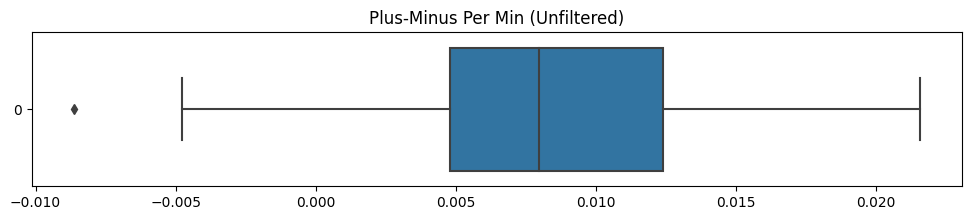

In [ ]:
fig = plt.figure(figsize=(12, 2))
plt.title("Plus-Minus Per Min (Unfiltered)")
sns.boxplot(data = raw_df["Plus-Minus Per Min"], orient = 'h')

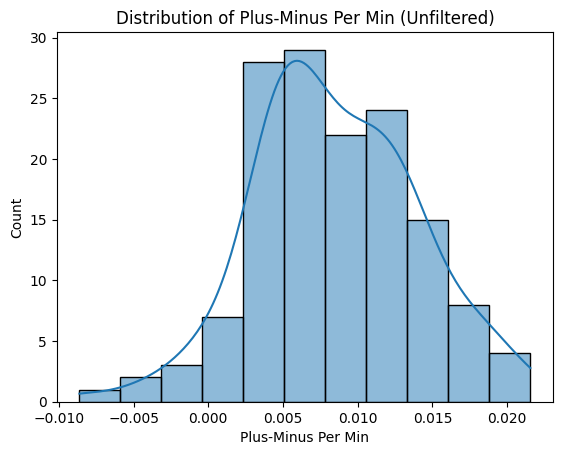

In [ ]:
sns.histplot(raw_df["Plus-Minus Per Min"], kde=True)
plt.title("Distribution of Plus-Minus Per Min (Unfiltered)")
plt.show()

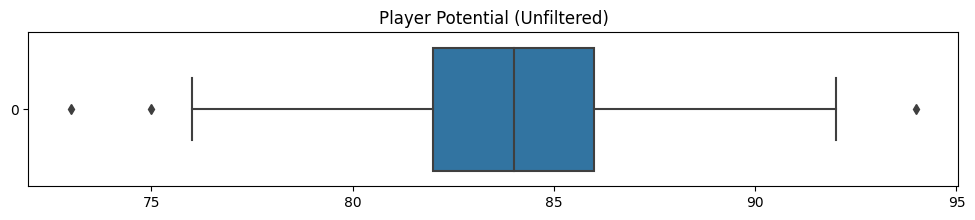

In [ ]:
fig = plt.figure(figsize = (12,2))
sns.boxplot(data = raw_df["potential"], orient = "h")
plt.title("Player Potential (Unfiltered)")
plt.show()

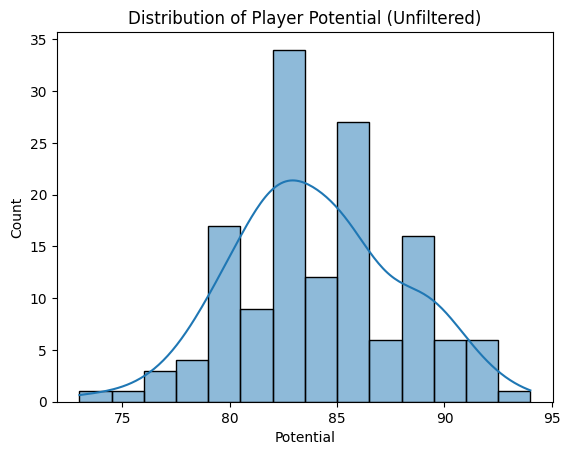

In [ ]:
sns.histplot(raw_df["potential"], kde = True)
plt.title("Distribution of Player Potential (Unfiltered)")
plt.xlabel("Potential")
plt.show()

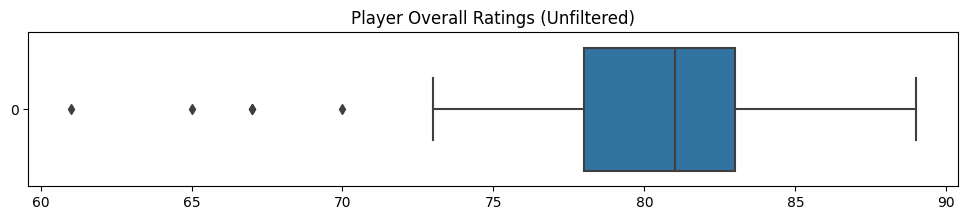

In [ ]:
fig = plt.figure(figsize = (12,2))
sns.boxplot(data = raw_df["best_overall"], orient = "h")
plt.title("Player Overall Ratings (Unfiltered)")
plt.show()

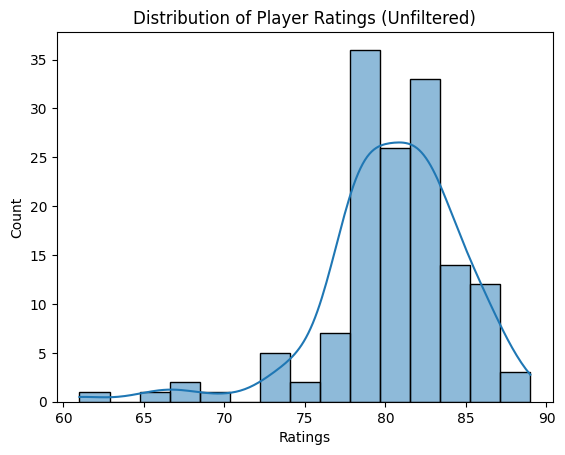

In [ ]:
sns.histplot(raw_df["best_overall"], kde = True)
plt.title("Distribution of Player Ratings (Unfiltered)")
plt.xlabel("Ratings")
plt.show()

In [ ]:
raw_df = pd.read_csv("data/raw.csv", index_col=0)

In [ ]:
raw_df = raw_df[["long_name", "potential", "best_overall", "Plus-Minus Per Min", "Season"]]
raw_df.sample(5)

,long_name,potential,best_overall,Plus-Minus Per Min,Season
6,Alex Nicolao Telles,80.0,80.0,0.000000,2021-2022
99,Juan Manuel Mata García,85.0,84.0,0.006963,2014-2015
73,Eric Bailly,90.0,82.0,0.009018,2016-2017
7,Nemanja Matić,79.0,79.0,-0.002180,2021-2022
135,Anders Lindegaard,80.0,78.0,0.006667,2012-2013


In [ ]:
# Important Metrics from our dataframe
raw_df.describe()

,Accumulated Playing Time,Accumulated Goals Scored,Accumulated Goals Lost,Plus-Minus,Plus-Minus Per Min,sofifa_id,age,potential,best_overall,growth,...,base_stats,weak_foot,skill_moves,international_reputation,pace_/_diving,shooting_/_handling,passing_/_kicking,dribbling_/_reflexes,defending_/_pace,physical_/_positioning
count,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000,...,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000,143.000000
mean,1827.958042,35.468531,19.783217,15.685315,0.008511,173290.104895,25.237762,84.020979,80.489510,3.300699,...,426.433566,3.118881,3.048951,2.489510,75.783217,66.951049,73.797203,77.055944,60.216783,72.629371
std,803.529546,17.061118,9.645943,11.309612,0.005454,63622.029130,4.285511,3.875653,4.300126,3.760497,...,31.604412,0.696970,1.023173,0.984865,10.855738,14.652466,8.675333,9.235401,19.141850,10.063655
min,466.000000,7.000000,2.000000,-5.000000,-0.008621,241.000000,17.000000,73.000000,61.000000,0.000000,...,323.000000,1.000000,1.000000,1.000000,44.000000,21.000000,49.000000,51.000000,22.000000,39.000000
25%,1181.500000,23.500000,13.000000,7.000000,0.004804,167905.000000,22.000000,82.000000,78.000000,0.000000,...,406.500000,3.000000,2.000000,2.000000,69.000000,56.000000,69.000000,73.000000,43.000000,68.000000
50%,1798.000000,34.000000,18.000000,14.000000,0.007977,191740.000000,25.000000,84.000000,81.000000,3.000000,...,427.000000,3.000000,3.000000,3.000000,77.000000,71.000000,75.000000,80.000000,65.000000,75.000000
75%,2411.000000,45.500000,26.500000,22.500000,0.012388,208390.000000,28.000000,86.000000,83.000000,5.000000,...,447.000000,4.000000,4.000000,3.000000,84.000000,77.500000,80.000000,84.000000,79.000000,79.000000
max,3510.000000,86.000000,51.000000,57.000000,0.021552,246147.000000,38.000000,94.000000,89.000000,16.000000,...,494.000000,5.000000,5.000000,5.000000,95.000000,90.000000,89.000000,93.000000,89.000000,89.000000


In [ ]:
feat = raw_df[["potential", "best_overall", "Plus-Minus Per Min"]]

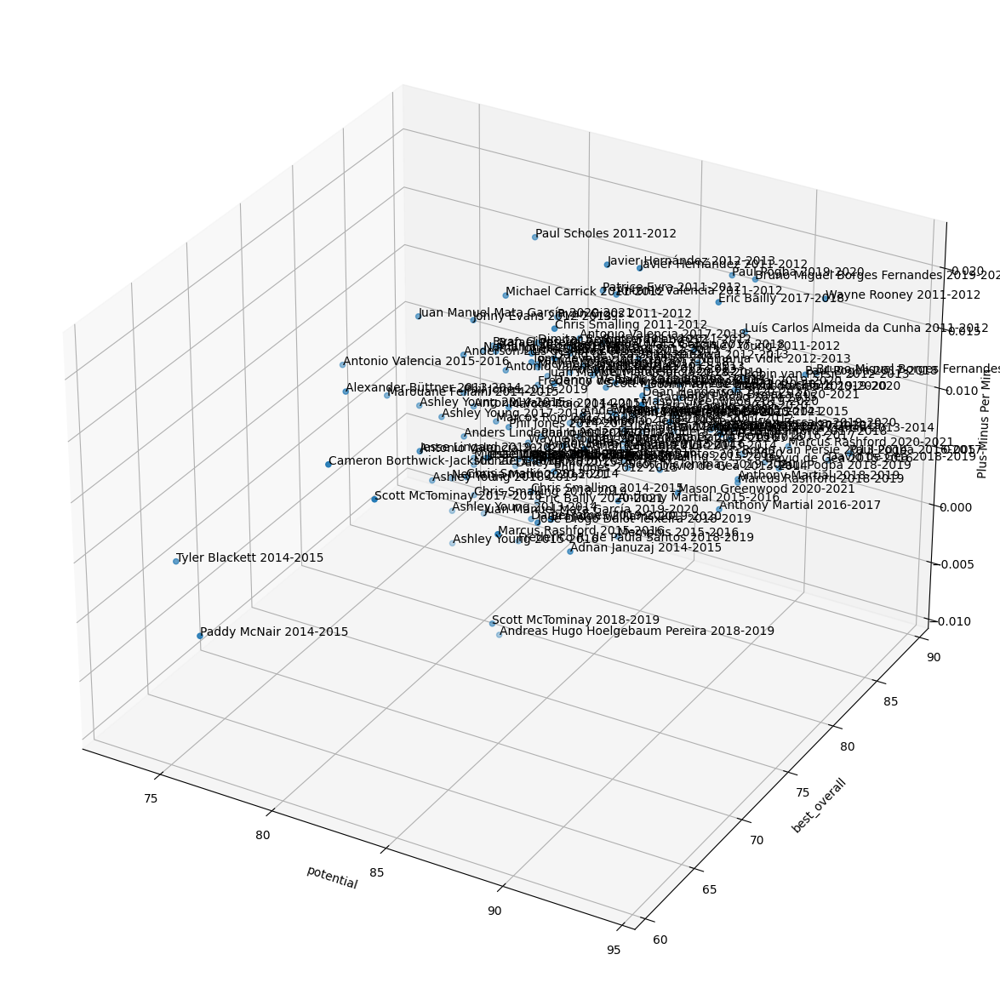

In [ ]:
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111,projection='3d')
ax.scatter(raw_df['potential'],raw_df['best_overall'],raw_df["Plus-Minus Per Min"])
ax.set_xlabel('potential')
ax.set_ylabel('best_overall')
ax.set_zlabel("Plus-Minus Per Min")

for i, row in raw_df.iterrows():
  ax.text(row['potential'], row['best_overall'], row['Plus-Minus Per Min'], (row['long_name'] + " " + row['Season']))

The 3D plot above shows a preliminary plot of the player data in a 3 Dimensional space. From preliminary visualiations, **Tyler Blackett's 2014-2015 season** and **Paddy McNair's 2014-2015** are outliers.

In [ ]:
# Filter for datapoints that are all within 1.5 IQR of the 1st and 3rd quantiles (Outlier filtering)
Q1 = feat.quantile(0.25)
Q3 = feat.quantile(0.75)

IQR = Q3 - Q1
# define the filter condition
filter_condition = ((feat < (Q1 - 1.5 * IQR)) | (feat > (Q3 + 1.5 * IQR))).any(axis=1)

In [ ]:
filtered_feat = raw_df.loc[~filter_condition]
removed_feat = raw_df.loc[filter_condition]

(-0.01012931034482757, 0.02306034482758617)

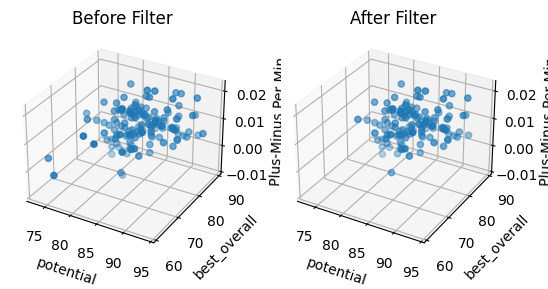

In [ ]:
fig = plt.figure()
ax1 = fig.add_subplot(121,projection='3d')
ax2 = fig.add_subplot(122,projection='3d')

ax1.set_xlabel('potential')
ax1.set_ylabel('best_overall')
ax1.set_zlabel("Plus-Minus Per Min")
ax1.set_title('Before Filter')
ax1.scatter(feat['potential'],feat['best_overall'],feat["Plus-Minus Per Min"])

ax2.set_xlabel('potential')
ax2.set_ylabel('best_overall')
ax2.set_zlabel("Plus-Minus Per Min")
ax2.set_title('After Filter')
ax2.scatter(filtered_feat['potential'],filtered_feat['best_overall'],filtered_feat["Plus-Minus Per Min"])

x1_lim = ax1.get_xlim()
y1_lim = ax1.get_ylim()
z1_lim = ax1.get_zlim()

ax2.set_xlim(x1_lim)
ax2.set_ylim(y1_lim)
ax2.set_zlim(z1_lim)

To train our deep autoencoder, we manually filtered the dataframe of any outliers. The plot on the left is the entire dataset of points without any filtering, while the plot on the right shows the post-filtered dataset of points after filtering. 

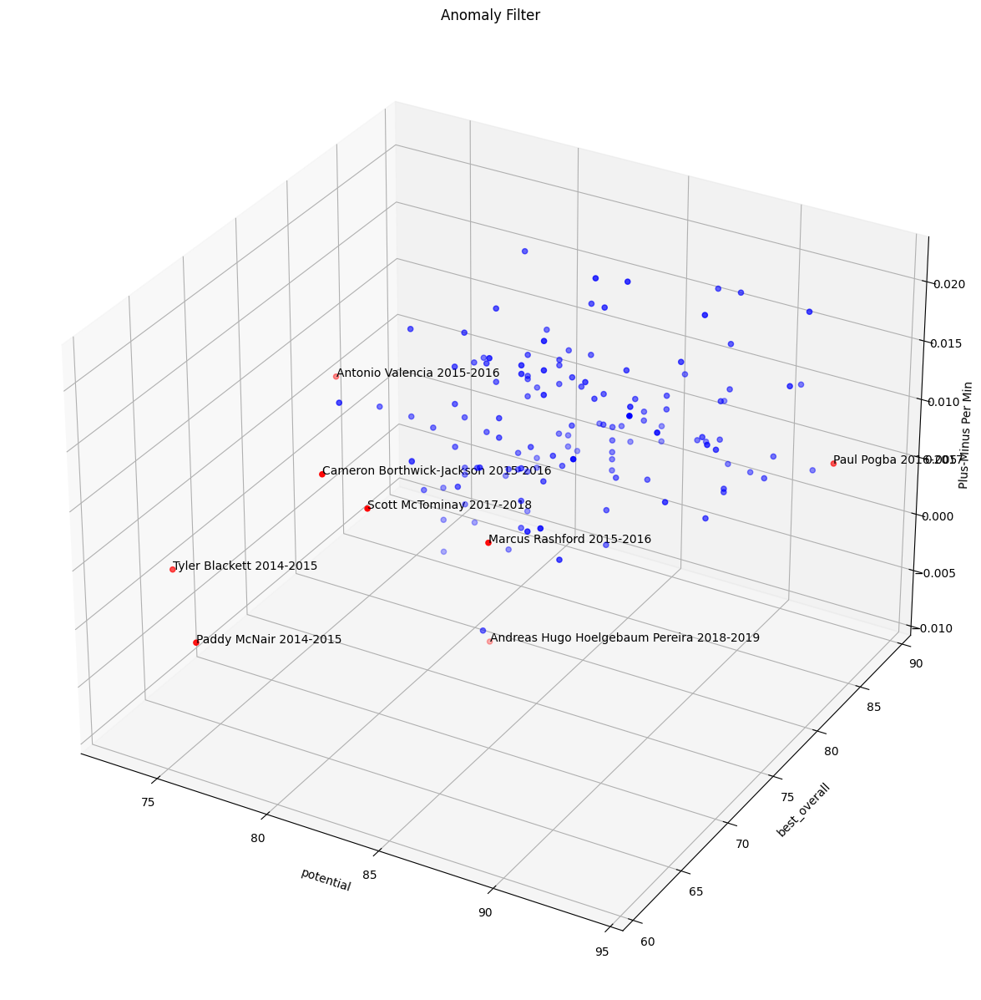

In [ ]:
fig = plt.figure(figsize=(15, 15))
ax1 = fig.add_subplot(111,projection='3d')

ax1.set_xlabel('potential')
ax1.set_ylabel('best_overall')
ax1.set_zlabel("Plus-Minus Per Min")
ax1.set_title('Anomaly Filter')

ax1.scatter(filtered_feat['potential'],filtered_feat['best_overall'],filtered_feat["Plus-Minus Per Min"], c='blue')
ax1.scatter(removed_feat['potential'],removed_feat['best_overall'],removed_feat["Plus-Minus Per Min"], c='red')

for i, row in removed_feat.iterrows():
  ax1.text(row['potential'], row['best_overall'], row['Plus-Minus Per Min'], (row['long_name'] + " " + row['Season']))

The datapoints that were sieved out are shown in the plot above in red.

In [ ]:
filtered_feat.to_csv("data/data.csv")

# Section 5: Data Pre-Processing

In this context, the training dataset will comprise Manchester United data points before the 2021-2022 season, while the test dataset will comprise Manchester United data points during the 2021-2022 season.

The training dataset will be used to form and train the machine learning or data science models for eventual application on the test dataset.

The 2021-2022 test dataset will be used to determine the outlier players that Manchester United players should consider moving on.

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

In [ ]:
raw_df = pd.read_csv("data/raw.csv", index_col=0)
filtered_df = pd.read_csv("data/data.csv", index_col=0)

In [ ]:
train_df = raw_df[raw_df['Season'] != '2021-2022']
test_df = raw_df[raw_df['Season'] == '2021-2022']
print(len(train_df), len(test_df))

train_filtered_df = filtered_df[filtered_df['Season'] != '2021-2022']

143 13


In [ ]:
train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)
train_filtered_df = train_filtered_df.reset_index(drop=True)

In [ ]:
df = train_df[["long_name", "potential", "best_overall", "Plus-Minus Per Min", "Season"]]
feats = df[["potential", "best_overall", "Plus-Minus Per Min"]]

filtered_df = train_filtered_df[["long_name", "potential", "best_overall", "Plus-Minus Per Min", "Season"]]
filtered_feats = train_filtered_df[["potential", "best_overall", "Plus-Minus Per Min"]]

# TODO: Remove
# removed_df = removed_feat.reset_index(drop=True)
# removed_feats = removed_df[["potential", "best_overall", "Plus-Minus Per Min"]]

In [ ]:
scaler = MinMaxScaler()
ae_scaler = MinMaxScaler()

In [ ]:
ae_train_scaled = ae_scaler.fit_transform(filtered_feats)
ae_preds_scaled = ae_scaler.transform(feats)

# TODO: Remove
# ae_removed_scaled = ae_scaler.transform(removed_feats)

feats = scaler.fit_transform(feats)

In [ ]:
x_train_scaled, x_validation_scaled = train_test_split(ae_train_scaled, test_size=0.2, random_state=42)

# Section 6: Data Pipeline Analysis

## Section 6.1: Anomaly Detection using Isolation Forest

In [ ]:
from sklearn.ensemble import IsolationForest
import numpy as np

In [ ]:
if_model = IsolationForest(n_estimators=100, max_samples='auto', contamination='auto')

# fit the model to the data
if_model.fit(feats)

# predict the outliers
outliers = if_model.predict(feats)

In [ ]:
outliers

array([ 1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,
       -1,  1,  1, -1,  1,  1, -1, -1,  1, -1,  1,  1,  1,  1,  1,  1, -1,
        1,  1,  1,  1,  1, -1,  1,  1, -1,  1,  1,  1,  1, -1,  1,  1,  1,
        1,  1, -1,  1, -1,  1,  1,  1,  1,  1,  1, -1,  1,  1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1, -1, -1, -1,  1,  1, -1,  1,  1,  1,
        1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1, -1, -1,  1, -1,  1,
        1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        1,  1, -1,  1,  1,  1,  1,  1,  1,  1, -1, -1,  1,  1,  1,  1,  1,
        1, -1,  1,  1,  1,  1,  1])

In [ ]:
outliers_df = df.loc[outliers == -1]

In [ ]:
feat_values = scaler.transform(outliers_df[["potential", "best_overall", "Plus-Minus Per Min"]])
total_values = np.sqrt(np.sum(np.square(feat_values), axis=1))
outliers_df['total'] = total_values

<ipython-input-218-842fcaec94ec>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers_df['total'] = total_values


In [ ]:
threshold = 1
outliers_df[outliers_df['total'] < threshold]

,long_name,potential,best_overall,Plus-Minus Per Min,Season,total
26,Brandon Williams,86.0,73.0,0.006548,2019-2020,0.905340
39,Andreas Hugo Hoelgebaum Pereira,82.0,77.0,-0.008621,2018-2019,0.714286
42,Scott McTominay,83.0,74.0,-0.004762,2018-2019,0.677255
53,Scott McTominay,81.0,67.0,0.009788,2017-2018,0.750521
76,Marcus Rashford,85.0,70.0,0.006961,2015-2016,0.834580
77,Antonio Valencia,75.0,77.0,0.010766,2015-2016,0.865117
78,Cameron Borthwick-Jackson,79.0,67.0,0.011561,2015-2016,0.758246
81,Ashley Young,79.0,79.0,-0.003820,2015-2016,0.721255
95,Adnan Januzaj,86.0,75.0,0.002392,2014-2015,0.875470
97,Paddy McNair,76.0,61.0,0.000000,2014-2015,0.319438


## Section 6.2: Anomaly Detection using One Class SVM

In [ ]:
from sklearn.svm import OneClassSVM

In [ ]:
# create the One-Class SVM model
ocsvm_model = OneClassSVM(kernel='rbf', nu=0.15)

# fit the model to the data
ocsvm_model.fit(feats)

# predict the outliers
outliers = ocsvm_model.predict(feats)
print(outliers)

[ 1  1 -1  1  1  1 -1  1  1  1  1  1 -1  1  1  1  1  1  1  1 -1  1  1 -1
 -1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1 -1  1  1 -1  1  1  1  1  1
  1  1  1  1  1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1 -1  1  1
  1  1  1  1 -1 -1 -1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1  1  1  1
  1 -1 -1  1  1  1  1  1  1  1  1  1 -1  1  1  1  1  1  1  1  1  1  1  1
  1 -1  1  1  1  1  1  1  1 -1 -1  1  1  1  1  1  1 -1  1  1  1 -1  1]


In [ ]:
outliers_df = df.loc[outliers == -1]

In [ ]:
feat_values = scaler.transform(outliers_df[["potential", "best_overall", "Plus-Minus Per Min"]])
total_values = np.sqrt(np.sum(np.square(feat_values), axis=1))
outliers_df['total'] = total_values

<ipython-input-223-842fcaec94ec>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers_df['total'] = total_values


In [ ]:
threshold = 1
outliers_df[outliers_df['total'] < threshold]

,long_name,potential,best_overall,Plus-Minus Per Min,Season,total
39,Andreas Hugo Hoelgebaum Pereira,82.0,77.0,-0.008621,2018-2019,0.714286
42,Scott McTominay,83.0,74.0,-0.004762,2018-2019,0.677255
76,Marcus Rashford,85.0,70.0,0.006961,2015-2016,0.834580
77,Antonio Valencia,75.0,77.0,0.010766,2015-2016,0.865117
78,Cameron Borthwick-Jackson,79.0,67.0,0.011561,2015-2016,0.758246
81,Ashley Young,79.0,79.0,-0.003820,2015-2016,0.721255
97,Paddy McNair,76.0,61.0,0.000000,2014-2015,0.319438
98,Tyler Blackett,73.0,65.0,0.001548,2014-2015,0.366046
108,Ashley Young,79.0,79.0,-0.000990,2013-2014,0.747567


## Section 6.3: Anomaly Detection using SGD One Class SVM 

In [ ]:
from sklearn.linear_model import SGDOneClassSVM

In [ ]:
# create the One-Class SVM model
sgdsvm_model = SGDOneClassSVM(nu=0.1)

# fit the model to the data
sgdsvm_model.fit(feats)

# predict the outliers
outliers = sgdsvm_model.predict(feats)

In [ ]:
outliers_df = df.loc[outliers == -1]

In [ ]:
feat_values = scaler.transform(outliers_df[["potential", "best_overall", "Plus-Minus Per Min"]])
total_values = np.sqrt(np.sum(np.square(feat_values), axis=1))
outliers_df['total'] = total_values

<ipython-input-228-842fcaec94ec>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers_df['total'] = total_values


In [ ]:
threshold = 1
outliers_df[outliers_df['total'] < threshold]

,long_name,potential,best_overall,Plus-Minus Per Min,Season,total
15,Nemanja Matić,79.0,79.0,0.001837,2020-2021,0.784231
27,Juan Manuel Mata García,80.0,80.0,-0.001393,2019-2020,0.793068
28,Jesse Lingard,78.0,78.0,0.004353,2019-2020,0.781144
39,Andreas Hugo Hoelgebaum Pereira,82.0,77.0,-0.008621,2018-2019,0.714286
40,Ashley Young,79.0,77.0,0.003076,2018-2019,0.747287
42,Scott McTominay,83.0,74.0,-0.004762,2018-2019,0.677255
45,Frederico R. de Paula Santos,82.0,79.0,-0.001929,2018-2019,0.803823
46,Antonio Valencia,78.0,78.0,0.004292,2018-2019,0.780039
53,Scott McTominay,81.0,67.0,0.009788,2017-2018,0.750521
76,Marcus Rashford,85.0,70.0,0.006961,2015-2016,0.834580


## Section 6.4: Anomaly Detection using AutoEncoders

In [ ]:
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras import Model, Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.model_selection import train_test_split
from tensorflow.keras.losses import MeanSquaredLogarithmicError
from tensorflow.keras.callbacks import EarlyStopping
import tensorflow as tf

In [ ]:
len(x_train_scaled), len(x_validation_scaled)

(108, 27)

In [ ]:
# create a model by subclassing Model class in tensorflow
class AutoEncoder(Model):
  """
  Parameters
  ----------
  output_units: int
    Number of output units
  
  code_size: int
    Number of units in bottle neck
  """

  def __init__(self, output_units, code_size=2):
    super().__init__()
    self.encoder = Sequential([
      # Dense(64, activation='relu'),
      # Dropout(0.1),
      # Dense(32, activation='relu'),
      # Dropout(0.1),
      # Dense(16, activation='relu'),
      # Dropout(0.1),
      Dense(code_size, activation='relu')
    ])
    self.decoder = Sequential([
      # Dense(16, activation='relu'),
      # Dropout(0.1),
      # Dense(32, activation='relu'),
      # Dropout(0.1),
      # Dense(64, activation='relu'),
      # Dropout(0.1),
      Dense(output_units, activation='sigmoid')
    ])
  
  def call(self, inputs):
    encoded = self.encoder(inputs)
    decoded = self.decoder(encoded)
    return decoded

In [ ]:
model = AutoEncoder(output_units=x_train_scaled.shape[1])
model.compile(loss='msle', metrics=['mse'], optimizer='adam')

In [ ]:
early_stop = EarlyStopping(monitor='val_loss', patience=5)

In [ ]:
history = model.fit(
    x_train_scaled,
    x_train_scaled,
    epochs=600,
    batch_size=8,
    validation_data=(x_validation_scaled, x_validation_scaled),
    callbacks=[early_stop]
)

Epoch 1/600
14/14 [==============================] - 1s 19ms/step - loss: 0.0380 - mse: 0.0849 - val_loss: 0.0313 - val_mse: 0.0647
Epoch 2/600
14/14 [==============================] - 0s 6ms/step - loss: 0.0361 - mse: 0.0810 - val_loss: 0.0299 - val_mse: 0.0617
Epoch 3/600
14/14 [==============================] - 0s 5ms/step - loss: 0.0343 - mse: 0.0773 - val_loss: 0.0288 - val_mse: 0.0594
Epoch 4/600
14/14 [==============================] - 0s 6ms/step - loss: 0.0330 - mse: 0.0745 - val_loss: 0.0279 - val_mse: 0.0574
Epoch 5/600
14/14 [==============================] - 0s 6ms/step - loss: 0.0318 - mse: 0.0719 - val_loss: 0.0272 - val_mse: 0.0558
Epoch 6/600
14/14 [==============================] - 0s 6ms/step - loss: 0.0309 - mse: 0.0699 - val_loss: 0.0265 - val_mse: 0.0544
Epoch 7/600
14/14 [==============================] - 0s 5ms/step - loss: 0.0300 - mse: 0.0679 - val_loss: 0.0260 - val_mse: 0.0532
Epoch 8/600
14/14 [==============================] - 0s 5ms/step - loss: 0.0293 - 

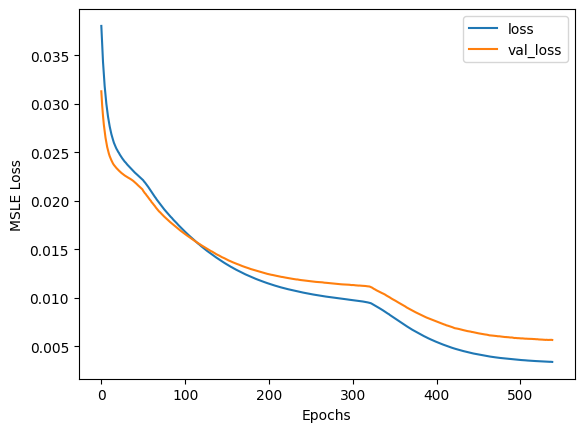

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('Epochs')
plt.ylabel('MSLE Loss')
plt.legend(['loss', 'val_loss'])

In [ ]:
def find_threshold(model, x_train_scaled):
  reconstructions = model.predict(x_train_scaled)
  # provides losses of individual instances
  reconstruction_errors = tf.keras.losses.msle(reconstructions, x_train_scaled)
  # threshold for anomaly scores
  threshold = np.mean(reconstruction_errors.numpy()) \
      + np.std(reconstruction_errors.numpy())
  return threshold

def get_predictions(model, x_test_scaled, threshold):
  predictions = model.predict(x_test_scaled)
  # provides losses of individual instances
  errors = tf.keras.losses.msle(predictions, x_test_scaled)
  # 0 = anomaly, 1 = normal
  anomaly_mask = pd.Series(errors) > threshold
  preds = anomaly_mask.map(lambda x: 0.0 if x == True else 1.0)
  return preds

In [ ]:
threshold = find_threshold(model, ae_train_scaled)
print(f"Threshold: {threshold}")

5/5 [==============================] - 0s 2ms/step
Threshold: 0.011034120331322332


In [ ]:
predictions = get_predictions(model, ae_preds_scaled, threshold)

5/5 [==============================] - 0s 2ms/step


In [ ]:
outliers_df = df.loc[predictions == 0]

In [ ]:
outliers_df

,long_name,potential,best_overall,Plus-Minus Per Min,Season
4,Mason Greenwood,89.0,79.0,0.006118,2020-2021
24,Mason Greenwood,89.0,75.0,0.016216,2019-2020
26,Brandon Williams,86.0,73.0,0.006548,2019-2020
41,José Diogo Dalot Teixeira,85.0,74.0,0.004995,2018-2019
42,Scott McTominay,83.0,74.0,-0.004762,2018-2019
53,Scott McTominay,81.0,67.0,0.009788,2017-2018
76,Marcus Rashford,85.0,70.0,0.006961,2015-2016
95,Adnan Januzaj,86.0,75.0,0.002392,2014-2015
100,Adnan Januzaj,87.0,74.0,0.012232,2013-2014
131,Phil Jones,89.0,78.0,0.012730,2011-2012


In [ ]:
feat_values = ae_scaler.transform(outliers_df[["potential", "best_overall", "Plus-Minus Per Min"]])
total_values = np.sqrt(np.sum(np.square(feat_values), axis=1))
outliers_df['total'] = total_values

<ipython-input-339-8cbc8bfe1ce2>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers_df['total'] = total_values


In [ ]:
threshold = 0.8
outliers_df[outliers_df['total'] < threshold]

,long_name,potential,best_overall,Plus-Minus Per Min,Season,total
26,Brandon Williams,86.0,73.0,0.006548,2019-2020,0.738068
41,José Diogo Dalot Teixeira,85.0,74.0,0.004995,2018-2019,0.652563
42,Scott McTominay,83.0,74.0,-0.004762,2018-2019,0.404853
53,Scott McTominay,81.0,67.0,0.009788,2017-2018,0.719359
76,Marcus Rashford,85.0,70.0,0.006961,2015-2016,0.719765
95,Adnan Januzaj,86.0,75.0,0.002392,2014-2015,0.670482


The Isolation Forest, One Class SVM and SGD One Class SVM models were trained on a unsupervised basis, while the deep autoencoder was trained on a semi-supervised basis. 

Due to the lack of a "ground truth" in unsupervised learning, it is difficult to compare the performance of these 4 models with one another, and hence all 4 models were used in the following section to predict underperforming Manchester United players over the 2021/2022 season.

# Section 7: Model Application
In this section, we apply the fitted anomaly detection models on the 2021/2022 season.

In [ ]:
df = test_df[["long_name", "potential", "best_overall", "Plus-Minus Per Min", "Season"]]

In [ ]:
feats = df[["potential", "best_overall", "Plus-Minus Per Min"]]
feats = scaler.transform(feats)

In [ ]:
def generate_anomalies(model, feats):
  outliers = model.predict(feats)
  outliers_df = df.loc[outliers == -1]
  feat_values = scaler.transform(outliers_df[["potential", "best_overall", "Plus-Minus Per Min"]])
  total_values = np.sqrt(np.sum(np.square(feat_values), axis=1))
  outliers_df['total'] = total_values
  threshold = 1
  return outliers_df[outliers_df['total'] < threshold]

## Section 7.1: Isolation Forest Application

In [ ]:
generate_anomalies(if_model, feats)

<ipython-input-163-2924ec35d834>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers_df['total'] = total_values


,long_name,potential,best_overall,Plus-Minus Per Min,Season,total
8,Anthony Elanga,85.0,72.0,0.00332,2021-2022,0.798418


## Section 7.2: One Class SVM Application

In [ ]:
generate_anomalies(ocsvm_model, feats)

<ipython-input-163-2924ec35d834>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers_df['total'] = total_values


,long_name,potential,best_overall,Plus-Minus Per Min,Season,total
1,Victor Lindelöf,82.0,82.0,-0.002983,2021-2022,0.883794
7,Nemanja Matić,79.0,79.0,-0.002180,2021-2022,0.735161
8,Anthony Elanga,85.0,72.0,0.003320,2021-2022,0.798418


## Section 7.3: SGD One Class SVM Application

In [ ]:
generate_anomalies(sgdsvm_model, feats)

<ipython-input-163-2924ec35d834>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers_df['total'] = total_values


,long_name,potential,best_overall,Plus-Minus Per Min,Season,total
6,Alex Nicolao Telles,80.0,80.0,0.00000,2021-2022,0.808210
7,Nemanja Matić,79.0,79.0,-0.00218,2021-2022,0.735161
8,Anthony Elanga,85.0,72.0,0.00332,2021-2022,0.798418


## Section 7.4: Autoencoder application

In [ ]:
feats = df[["potential", "best_overall", "Plus-Minus Per Min"]]
feats = ae_scaler.transform(feats)
predictions = get_predictions(model, feats, threshold)
outliers_df = df.loc[predictions == 0]

if len(outliers_df) > 0:
  feat_values = ae_scaler.transform(outliers_df[["potential", "best_overall", "Plus-Minus Per Min"]])
  total_values = np.sqrt(np.sum(np.square(feat_values), axis=1))
  outliers_df['total'] = total_values
  threshold = 0.8
  outliers_df[outliers_df['total'] < threshold]
else:
  print("No Outliers Found.")

1/1 [==============================] - 0s 37ms/step
No Outliers Found.


### Compiled List of Poor Performing Players

| Model                     | Poor Performing Players  |
| ------------------------- | ------------------------ |
| Isolation Forest          | Anthony Elanga           |
| One Class SVM             | Victor Lindelof, Nemenja Matic, Anthony Elanga          |
| SGD One Class SVM         | Alex Telles, Nemenja Matic, Anthony Elanga                |
| Deep Autoencoder          | -                |

As shown from the results above, commonly identified poor performing players are **Anthony Elanga** and **Nemenja Matic**. 

Empirically, the 2021/2022 season was indeed a difficult one for *Matic*, failing to secure a firm spot in the starting XI. 

On the other hand, the 2021/2022 season was a breakthrough season for *Anthony Elanga*, and was frequently the bright spark for the team towards the tail end of the season. However, Elanga's breakthrough unfortunately coincided with Manchester United's dip in form towards the end of the season, which has definitely hampered Elanga's plus-minus ratings. 

# Section 8: Conclusion

In our analysis, we used a total of **4** different machine learning and data science models. They include:

1. Isolation Forest
2. One Class SVM
3. SGD One Class SVM
4. Deep Autoencoder

These models were trained in an unsupervised manner; hence there was no "ground truth" to evaluate these models upon. As such, all 4 models were utilised for the eventual model application section.

The two players that were commonly identified as performance anomalies were **Nemenja Matic** and **Anthony Elanga**. Even though the model's identification of *Matic* makes empirical sense, its identification of *Elanga* shows the metric-bias nature of our models. 

Even though *Elanga* was the bright spark of the team in 2021/2022, his breakthrough coincided with a team in the team's form, resulting in much lower plus-minus ratings as compared to his other teammates, whose metrics were diluted over the course of the entire season. Our method of analysis does not factor in the weightage of the player's contribution in matches - a limitation of our analysis. 

Possible future improvements would include adding a bigger variety of different statistics to paint a more holistic picture of the player's performance on the field, or even possibly analysing real-life footage from football games and retrieving various different metrics in the player's movement and off-the-ball contributions.